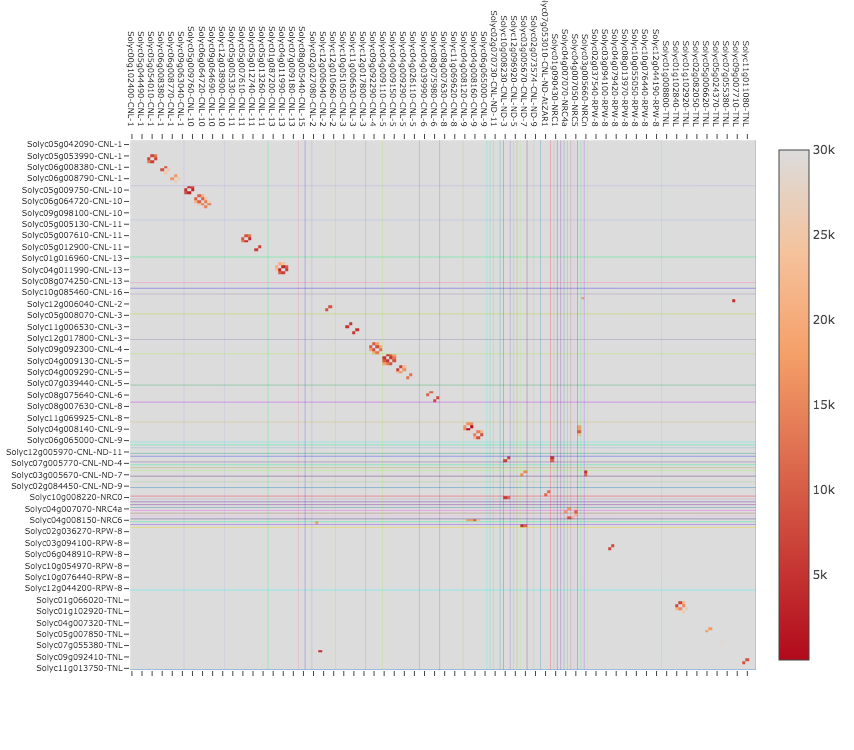

In [20]:
import plotly
import plotly.plotly as py
import plotly.graph_objs as go
import copy
import pandas as pd
import numpy as np
import random
from scipy.spatial import distance
from scipy.cluster.hierarchy import dendrogram, linkage


threshold = 30000

### extract clade information
NLR_list = pd.read_csv("original_data/tomato_clade_info_myself.csv")
clade_info = NLR_list.loc[:, ["gene_short_na", "NLR clade"]]
clade_info.columns = ["id", "clade"]

### extract gene_distance info
NLR_gene_info = pd.read_csv("original_data/NLR_gene_info.csv", index_col=0)
position_data = NLR_gene_info.iloc[:, [0,3,4,9]]
position_data.columns = ["chr", "start", "end", "id"]

### merge both data
position_data = pd.merge(position_data, clade_info, on='id')

def calc_distance(data_from_chr):
    tmp_position_data = data_from_chr.iloc[:, 1]
    tmp_position_data = np.stack([np.array(tmp_position_data), np.zeros(tmp_position_data.shape[0])], 1)

    dist = distance.cdist(tmp_position_data, tmp_position_data, metric='euclidean')
    return dist

### calculate distances between genes

# chr_name = "SL3.0ch04"
# position_data = position_data[position_data["chr"] == chr_name]
position_data = position_data.sort_values(["clade", "id"])

dist = pd.DataFrame(calc_distance(position_data))
dist.index = position_data["chr"].values
dist.columns = position_data["chr"].values

position_data['id_clade'] = position_data['id'].str.cat(position_data['clade'], sep='-')

origin_dist = copy.copy(dist)

for i in range(dist.shape[0]):
    diff_chr = dist.columns != dist.index[i]
    dist.iloc[i, :].loc[diff_chr] = threshold
    origin_dist.iloc[i, :].loc[diff_chr] = np.nan

dist = np.array(dist)
origin_dist = np.array(origin_dist)
dist = np.flip(dist, 0)
origin_dist = np.flip(origin_dist, 0)
dist[dist==0] = threshold
dist[dist>threshold] = threshold

### set text of cells
hovertext = list()
for yi, yy in enumerate(position_data["id"].values[::-1]):
    hovertext.append(list())
    for xi, xx in enumerate(position_data["id"].values):
        hovertext[-1].append('1: {} {}<br />2: {} {}<br />Distance: {}'.format(yy, position_data["clade"].values[::-1][yi], xx, position_data["clade"].values[xi], origin_dist[yi][xi]))

### make heatmap
trace = go.Heatmap(
                   z=dist,
                   colorscale="Reds",
                   reversescale=True,
                   x=position_data["id_clade"],
                   y=position_data["id_clade"].values[::-1],
                   hoverinfo='text',
                   text=hovertext
                  )
data=[trace]

### add separate lines of clade
lines = []
start = -0.5

colorlist = []
for i in range(len(position_data["clade"].unique())):
    colorlist.append("rgb"+str(tuple(np.random.random(size=3)*256)))

for i, each_clade in enumerate(position_data["clade"].unique()):
    start += position_data["clade"].value_counts()[each_clade]
    lines.append(dict(
                      type="line", xref="x", yref="y",
                      x0=start, y0=-0.5,
                      x1=start, y1=position_data.shape[0]-0.5,
                      opacity=0.5,
                      line=dict(color=colorlist[i], width=0.5))
                     )
    lines.append(dict(
                      type="line", xref="x", yref="y",
                      x0=-0.5, y0=position_data.shape[0]-1-start,
                      x1=position_data.shape[0]-0.5, y1=position_data.shape[0]-1-start,
                      opacity=0.75,
                      line=dict(color=colorlist[i], width=0.5))
                     )

### setting layout & draw
layout = go.Layout(
                   margin=dict(l=130, t=140),
                   width=750,
                   height=750,
                   autosize=False,
                   xaxis=dict(mirror="allticks", side="top", tickfont=dict(size=8)),
                   yaxis=dict(tickfont=dict(size=8)),
                   shapes=lines
                  )
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig, filename='basic-heatmap')

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:68: RuntimeWarning:

divide by zero encountered in log2

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:69: RuntimeWarning:

divide by zero encountered in log2



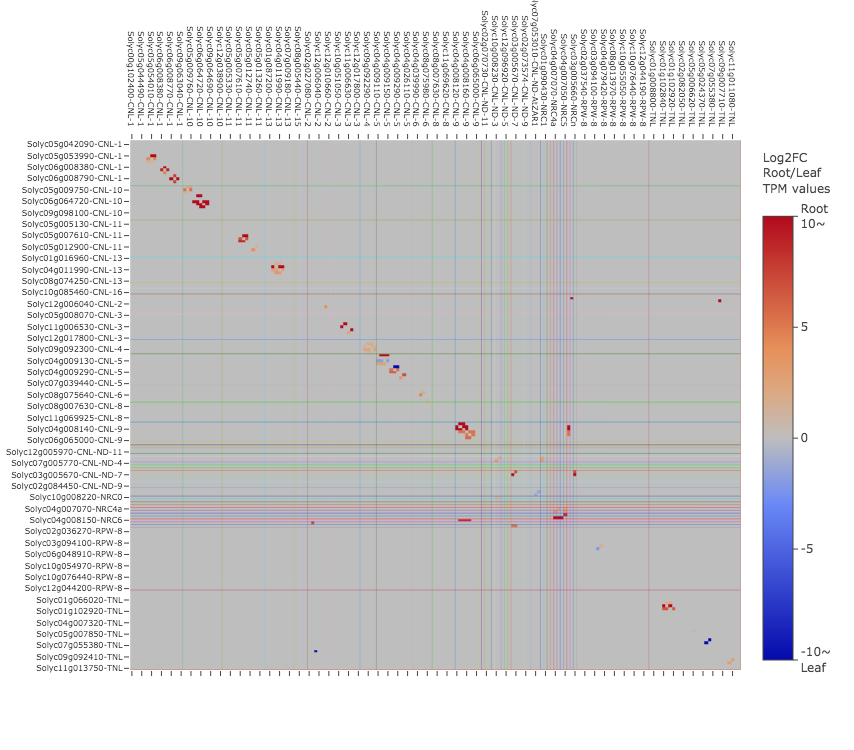

In [19]:
import plotly
import plotly.plotly as py
import plotly.graph_objs as go
import copy
import pandas as pd
import numpy as np
import random
from scipy.spatial import distance
from scipy.cluster.hierarchy import dendrogram, linkage


threshold = 30000

### extract clade information
NLR_list = pd.read_csv("original_data/tomato_clade_info_myself.csv")
clade_info = NLR_list.loc[:, ["gene_short_na", "NLR clade"]]
clade_info.columns = ["id", "clade"]

### extract expression information
TPM_info = pd.read_csv("original_data/tomato_NLRs_from_AKI.csv")
TPM_info = TPM_info.loc[:, ["gene_short_na", "Root_TPM", "Leaf_TPM"]]
TPM_info.columns = ["id", "Root_TPM", "Leaf_TPM"]

clade_info = pd.merge(clade_info, TPM_info, on='id')

### extract gene_distance info
NLR_gene_info = pd.read_csv("original_data/NLR_gene_info.csv", index_col=0)
position_data = NLR_gene_info.iloc[:, [0,3,4,9]]
position_data.columns = ["chr", "start", "end", "id"]

### merge both data
position_data = pd.merge(position_data, clade_info, on='id')

def calc_distance(data_from_chr):
    tmp_position_data = data_from_chr.iloc[:, 1]
    tmp_position_data = np.stack([np.array(tmp_position_data), np.zeros(tmp_position_data.shape[0])], 1)

    dist = distance.cdist(tmp_position_data, tmp_position_data, metric='euclidean')
    return dist

### calculate distances between genes

# chr_name = "SL3.0ch04"
# position_data = position_data[position_data["chr"] == chr_name]
position_data = position_data.sort_values(["clade", "id"])

dist = pd.DataFrame(calc_distance(position_data))
dist.index = position_data["chr"].values
dist.columns = position_data["chr"].values

position_data['id_clade'] = position_data['id'].str.cat(position_data['clade'], sep='-')

origin_dist = copy.copy(dist)

for i in range(dist.shape[0]):
    diff_chr = dist.columns != dist.index[i]
    dist.iloc[i, :].loc[diff_chr] = threshold
    origin_dist.iloc[i, :].loc[diff_chr] = np.nan

dist = np.array(dist)
origin_dist = np.array(origin_dist)
dist = np.flip(dist, 0)
origin_dist = np.flip(origin_dist, 0)
dist[dist==0] = threshold
dist[dist>threshold] = threshold

### expression_data
log2_Root = np.log2(position_data["Root_TPM"])
log2_Leaf = np.log2(position_data["Leaf_TPM"])
exp_ratio = log2_Root - log2_Leaf
origin_exp_ratio = copy.copy(exp_ratio)
exp_ratio = exp_ratio.values[::-1]
origin_exp_ratio = origin_exp_ratio.values[::-1]
exp_ratio[exp_ratio > 10] = 10
exp_ratio[exp_ratio < -10] = -10
exp_ratio[np.isnan(exp_ratio)] = 0
exp_ratio_matrix = np.tile(exp_ratio, (position_data.shape[0],1)).T
exp_ratio_matrix[dist >= threshold] = 0

### set text of cells
hovertext = list()
for yi, yy in enumerate(position_data["id"].values[::-1]):
    hovertext.append(list())
    for xi, xx in enumerate(position_data["id"].values):
        hovertext[-1].append('1: {} {}<br />2: {} {}<br />1: Root: {} Leaf: {}<br />2: Root: {} Leaf: {}<br />Distance: {}'.format(
                                        yy, position_data["clade"].values[::-1][yi],
                                        xx, position_data["clade"].values[xi],
                                        '{:.4f}'.format(position_data["Root_TPM"].values[::-1][yi]),
                                        '{:.4f}'.format(position_data["Leaf_TPM"].values[::-1][yi]),
                                        '{:.4f}'.format(position_data["Root_TPM"].values[xi]),
                                        '{:.4f}'.format(position_data["Leaf_TPM"].values[xi]),
                                        origin_dist[yi][xi],
                                        )
                            )
        
### make heatmap
trace = go.Heatmap(
                    z=exp_ratio_matrix,
                    colorscale="RdBu",
                    reversescale=False,
                    x=position_data["id_clade"],
                    y=position_data["id_clade"].values[::-1],
                    hoverinfo='text',
                    text=hovertext,
                    colorbar = dict(
                            title = 'Log2FC<br />Root/Leaf<br />TPM values<br />&nbsp;',
                            titleside = 'top',
                            tickmode = 'array',
                            tickvals = [-10,-5,0,5,10],
                            ticktext = ["-10~<br />Leaf","-5","0","5","Root<br />10~"],
                            ticks = 'outside'
                        )
                  )
data=[trace]

### add separate lines of clade
lines = []
start = -0.5

colorlist = []
for i in range(len(position_data["clade"].unique())):
    colorlist.append("rgb"+str(tuple(np.random.random(size=3)*256)))

for i, each_clade in enumerate(position_data["clade"].unique()):
    start += position_data["clade"].value_counts()[each_clade]
    lines.append(dict(
                      type="line", xref="x", yref="y",
                      x0=start, y0=-0.5,
                      x1=start, y1=position_data.shape[0]-0.5,
                      opacity=0.5,
                      line=dict(color=colorlist[i], width=0.5))
                     )
    lines.append(dict(
                      type="line", xref="x", yref="y",
                      x0=-0.5, y0=position_data.shape[0]-1-start,
                      x1=position_data.shape[0]-0.5, y1=position_data.shape[0]-1-start,
                      opacity=0.75,
                      line=dict(color=colorlist[i], width=0.5))
                     )

### setting layout & draw
layout = go.Layout(
                   margin=dict(l=130, t=140),
                   width=750,
                   height=750,
                   autosize=False,
                   xaxis=dict(mirror="allticks", side="top", tickfont=dict(size=8)),
                   yaxis=dict(tickfont=dict(size=8)),
                   shapes=lines
                  )
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig, filename='basic-heatmap')

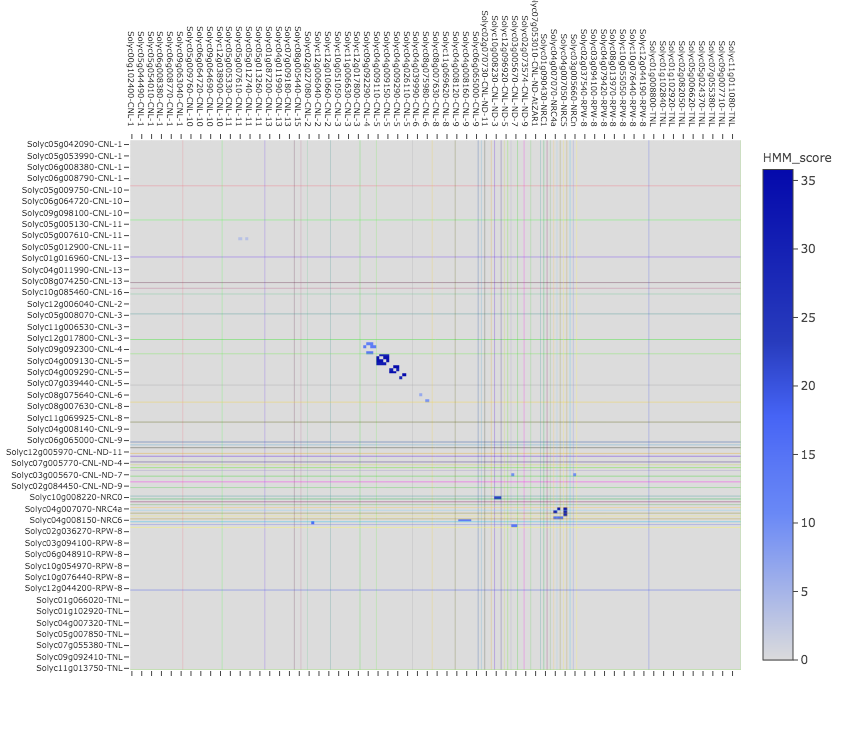

In [22]:
import plotly
import plotly.plotly as py
import plotly.graph_objs as go
import copy
import pandas as pd
import numpy as np
import random
from scipy.spatial import distance
from scipy.cluster.hierarchy import dendrogram, linkage


threshold = 30000

### extract clade information
NLR_list = pd.read_csv("original_data/tomato_clade_info_myself.csv")
clade_info = NLR_list.loc[:, ["gene_short_na", "NLR clade"]]
clade_info.columns = ["id", "clade"]

### extract gene_distance info
NLR_gene_info = pd.read_csv("original_data/NLR_gene_info.csv", index_col=0)
position_data = NLR_gene_info.iloc[:, [0,3,4,9]]
position_data.columns = ["chr", "start", "end", "id"]

### extranct MADA HMM score
MADA_info = pd.read_csv("original_data/MADA_tomato.csv")
MADA_info = MADA_info.loc[:, ["ID", "HMM score", "Seq-F"]]
MADA_info.columns = ["id", "HMM_score", "Seq-F"]

### merge data
position_data = pd.merge(position_data, clade_info, on='id')
position_data = pd.merge(position_data, MADA_info, on='id', how='left')

def calc_distance(data_from_chr):
    tmp_position_data = data_from_chr.iloc[:, 1]
    tmp_position_data = np.stack([np.array(tmp_position_data), np.zeros(tmp_position_data.shape[0])], 1)

    dist = distance.cdist(tmp_position_data, tmp_position_data, metric='euclidean')
    return dist

### calculate distances between genes

# chr_name = "SL3.0ch04"
# position_data = position_data[position_data["chr"] == chr_name]
position_data = position_data.sort_values(["clade", "id"])

dist = pd.DataFrame(calc_distance(position_data))
dist.index = position_data["chr"].values
dist.columns = position_data["chr"].values

position_data['id_clade'] = position_data['id'].str.cat(position_data['clade'], sep='-')

origin_dist = copy.copy(dist)

for i in range(dist.shape[0]):
    diff_chr = dist.columns != dist.index[i]
    dist.iloc[i, :].loc[diff_chr] = threshold
    origin_dist.iloc[i, :].loc[diff_chr] = np.nan

dist = np.array(dist)
origin_dist = np.array(origin_dist)
dist = np.flip(dist, 0)
origin_dist = np.flip(origin_dist, 0)
dist[dist==0] = threshold
dist[dist>threshold] = threshold

### MADA_data
MADA = position_data["HMM_score"]
MADA = MADA[::-1]
MADA = MADA.fillna(0)
exp_ratio_matrix = np.tile(MADA, (position_data.shape[0],1)).T
exp_ratio_matrix[dist >= threshold] = 0

### set text of cells
hovertext = list()
for yi, yy in enumerate(position_data["id"].values[::-1]):
    hovertext.append(list())
    for xi, xx in enumerate(position_data["id"].values):
        hovertext[-1].append('1: {} {}<br />2: {} {}<br />1: HMM_score: {} Seq-F: {}<br />2: HMM_score: {} Seq-F: {}<br />Distance: {}'.format(
                                        yy, position_data["clade"].values[::-1][yi],
                                        xx, position_data["clade"].values[xi],
                                        position_data["HMM_score"].values[::-1][yi],
                                        position_data["Seq-F"].values[::-1][yi],
                                        position_data["HMM_score"].values[xi],
                                        position_data["Seq-F"].values[xi],
                                        origin_dist[yi][xi],
                                        )
                            )
        
### make heatmap
trace = go.Heatmap(
                    z=exp_ratio_matrix,
                    colorscale="Blues",
                    reversescale=True,
                    x=position_data["id_clade"],
                    y=position_data["id_clade"].values[::-1],
                    hoverinfo='text',
                    text=hovertext,
                    colorbar = dict(
                            title = 'HMM_score',
                            titleside = 'top',
                            tickmode = 'array',
                            tickvals = [0,5,10,15,20,25,30,35],
                            ticktext = ["0","5","10","15","20","25","30","35"],
                            ticks = 'outside'
                        )
                  )
data=[trace]

### add separate lines of clade
lines = []
start = -0.5

colorlist = []
for i in range(len(position_data["clade"].unique())):
    colorlist.append("rgb"+str(tuple(np.random.random(size=3)*256)))

for i, each_clade in enumerate(position_data["clade"].unique()):
    start += position_data["clade"].value_counts()[each_clade]
    lines.append(dict(
                      type="line", xref="x", yref="y",
                      x0=start, y0=-0.5,
                      x1=start, y1=position_data.shape[0]-0.5,
                      opacity=0.5,
                      line=dict(color=colorlist[i], width=0.5))
                     )
    lines.append(dict(
                      type="line", xref="x", yref="y",
                      x0=-0.5, y0=position_data.shape[0]-1-start,
                      x1=position_data.shape[0]-0.5, y1=position_data.shape[0]-1-start,
                      opacity=0.75,
                      line=dict(color=colorlist[i], width=0.5))
                     )

### setting layout & draw
layout = go.Layout(
                   margin=dict(l=130, t=140),
                   width=750,
                   height=750,
                   autosize=False,
                   xaxis=dict(mirror="allticks", side="top", tickfont=dict(size=8)),
                   yaxis=dict(tickfont=dict(size=8)),
                   shapes=lines
                  )
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig, filename='basic-heatmap')